<a href="https://colab.research.google.com/github/EmanuelAlogna/MRI-generation/blob/master/results/MI_GAN_39ep_genT1_v4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import libraries and mount the drive

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython import display
import time
import math

print(tf.__version__)

from google.colab import drive
drive.mount('/content/drive')

TensorFlow 2.x selected.
2.1.0-rc1
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Loading train, validation and test sets

In [0]:
def get_feature_description(modalities):                                                   
                                                                                           
    feature_description =lambda mod : {                                                    
                            mod+'_mri': tf.io.FixedLenFeature([], tf.string),              
                            mod+'_path': tf.io.FixedLenFeature([], tf.string),             
                                                                                           
                            mod+'_mri_min': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_min_src': tf.io.FixedLenFeature([], tf.float32),     
                            mod+'_mri_max': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_max_src': tf.io.FixedLenFeature([], tf.float32),     
                                                                                           
                            mod+'_mri_lperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_mri_lperc_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_x_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_y_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_x_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_y_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                                                                                           
                            mod+'_x_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_y_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_z_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                                                                                           
                            mod+'_z_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_x_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_y_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_patient': tf.io.FixedLenFeature([], tf.string),          
                            mod+'_sample_number': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_grade': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_location': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_version': tf.io.FixedLenFeature([], tf.string),  
                            mod+'_dataset_name': tf.io.FixedLenFeature([], tf.string),     
                            mod+'_mri_type': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_split': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_mri_seq': tf.io.FixedLenFeature([], tf.string),  
                          }                                                                
    features = {}                                                                          
    for mod in modalities:
        features.update(feature_description(mod))
    return features

In [0]:
#BUFFER_SIZE = 400
BATCH_SIZE = 32

In [0]:
use_gzip_compression = True

def load_dataset(name, mri_type, center_crop=None, random_crop=None, filter=None, batch_size=BATCH_SIZE, cache=True, 
                 prefetch_buffer=1, shuffle_buffer=128, interleave=1, cast_to=tf.float32, clip_labels_to=0.0, 
                 take_only=None, shuffle=True, infinite=False, n_threads=os.cpu_count()):
    def parse_sample(sample_proto):
        parsed = tf.io.parse_single_example(sample_proto, get_feature_description(["OT"]+mri_type))
        # Decoding image arrays
        
        slice_shape = [parsed['OT_x_dimension'.format(mri_type[0])], parsed['OT_y_dimension'], 1]
        # Decoding the ground truth
        parsed['seg'] = tf.cast(tf.reshape(tf.io.decode_raw(parsed['OT_mri'], tf.float32), shape=slice_shape), dtype=cast_to)
        # Decode each channel and stack in a 3d volume
        stacked_mri = list()
        for mod in mri_type:
            stacked_mri.append(tf.cast(tf.reshape(tf.io.decode_raw(parsed['{}_mri'.format(mod)], tf.float32), shape=slice_shape), dtype=cast_to))
        parsed['mri'] = tf.concat(stacked_mri, axis=-1)
        # Clipping the labels if requested
        parsed['seg'] = tf.clip_by_value(parsed['seg'], 0.0, clip_labels_to) if clip_labels_to else parsed['seg']
        
        # Cropping
        if random_crop or center_crop:
            # Stacking the mri and the label to align the crop shape
            mri_seg = tf.concat([parsed['mri'], parsed['seg']], axis=-1)
            if random_crop:
                random_crop[-1] = mri_seg.shape[-1] 
                cropped = tf.image.random_crop(mri_seg, size=random_crop)
            else:
                cropped = tf.image.resize_with_crop_or_pad(mri_seg,center_crop[0],center_crop[1])
            # Splitting back
            parsed['mri'] = cropped[:,:,:len(mri_type)]
            parsed['seg'] = cropped[:,:,len(mri_type):]
        
        return parsed
    
    path = './drive/My Drive/MRI-generation/{}.tfrecords'.format(name)
    dataset = tf.data.TFRecordDataset(path, compression_type='GZIP' if use_gzip_compression else "")
    dataset = dataset.filter(filter) if filter is not None else dataset
    dataset = dataset.take(take_only) if take_only is not None else dataset

    # You should generally cache after loading and preprocessing the data, 
    # but before shuffling, repeating, batching and prefetching”
    dataset = dataset.cache() if cache else dataset
    if shuffle and infinite:
        dataset = dataset.apply(tf.data.experimental.shuffle_and_repeat(shuffle_buffer))
    else:
        dataset = dataset.shuffle(shuffle_buffer, reshuffle_each_iteration=True) if shuffle else dataset
        dataset = dataset.repeat() if infinite else dataset
    dataset = dataset.map(parse_sample, num_parallel_calls=None)
    dataset = dataset.batch(batch_size) if batch_size > 0 else dataset
    

    if interleave > 1:
        dataset = dataset.interleave(lambda x: tf.data.Dataset.from_tensors(x).repeat(interleave), cycle_length=n_threads, block_length=interleave, num_parallel_calls=n_threads)
  
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [0]:
# loading all the dataset, with only modality T1 and T2
# I'll focus now on synthesizing T2 from T1

def load_datasets():
    validation = load_dataset('brats2015_validation_crop_mri', ['MR_T1', 'MR_T1c', 'MR_T2', 'MR_Flair'], shuffle=False)
    training = load_dataset('brats2015_training_crop_mri', ['MR_T1', 'MR_T1c', 'MR_T2', 'MR_Flair'], shuffle=True)
    testing = load_dataset('brats2015_testing_crop_mri', ['MR_T1', 'MR_T1c', 'MR_T2', 'MR_Flair'], shuffle=True)
    return training, validation , testing

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

modalities = ['MR_T1_mri', 'MR_T2_mri', 'MR_T1c_mri', 'MR_Flair_mri', 'OT_mri']

## Load some useful functions


In [0]:
# PROCESSING IMAGES IN THE BATCH
def process_batch(batch):   # takes in input a raw_record[mod].numpy()
    batch = tf.io.decode_raw(batch, tf.float32)
    batch = tf.reshape(batch, (BATCH_SIZE, 180, 180))
    paddings = tf.constant([[0, 0], [38, 38], [38, 38]])
    batch = tf.pad(batch, paddings, "CONSTANT")
    batch = tf.expand_dims(batch, axis=3)
    return batch
    
# final shape will be (bs, 256, 256, 1): now the batch is ready to be fed to the GAN

In [0]:
# this function preprocesses the input image and the ground truth from a raw_record
# images in the return are then ready to be fed into the GAN
def take_images_from_raw(raw_record, ot=False):

    t1, t2, t1c, tflair = raw_record[modalities[0]], raw_record[modalities[1]], raw_record[modalities[2]], raw_record[modalities[3]]
    t1 = process_batch(t1)
    t2 = process_batch(t2)
    t1c = process_batch(t1c)
    tflair = process_batch(tflair)
    if ot:      # if ot is true, I'll retrieve also the segmentation from the raw_record
        segmentation = process_batch(raw_record[modalities[4]])
        return t1, t2, t1c, tflair, segmentation
    return t1, t2, t1c, tflair

In [0]:
def resize_with_crop(*args): # possibile arguments: input, gt, prediction and maybe the segmentation

    image0 = tf.image.resize_with_crop_or_pad(args[0], 155, 194)
    image1 = tf.image.resize_with_crop_or_pad(args[1], 155, 194)
    image2 = tf.image.resize_with_crop_or_pad(args[2], 155, 194)
    image3 = tf.image.resize_with_crop_or_pad(args[3], 155, 194)
    if len(args) == 5:      # crop also the segmentation, if is given as additional argument
        image4 = tf.image.resize_with_crop_or_pad(args[4], 155, 194)
        return image0, image1, image2, image3, image4
    if len(args) == 6:      # crop also the segmentation, if is given as additional argument
        image4 = tf.image.resize_with_crop_or_pad(args[4], 155, 194)
        image5 = tf.image.resize_with_crop_or_pad(args[5], 155, 194)
        return image0, image1, image2, image3, image4, image5
    return image0, image1, image2, image3

In [0]:
def retrieve_tumor_area(ground_truth, prediction, segmentation):
    ground_truth_np = ground_truth.numpy()
    segmentation_np = segmentation.numpy()
    prediction_np = prediction.numpy()

    # I want to remove all the pixels not relevant wrt the tumor area. 
    idx = (segmentation_np==0)      
    ground_truth_np[idx] = segmentation_np[idx]
    prediction_np[idx] = segmentation_np[idx]

    return ground_truth_np, prediction_np      # Now the images are ready to be evaluated

## Evaluate GAN

In [0]:
def evaluate_GAN(model, dataset, set_type, evaluate_tumor_area=False, print_loss=False, epc=99):
    num_batches = 0                 # CAREFUL when batch_size is modified!!!
    if set_type == 'test':
        num_batches = 112           # in the test set, with batch 32, there are 112 elements.
    elif set_type == 'validation':
        num_batches = 108
    elif set_type == 'train':
        num_batches = 876
    
    ######## remove this ######
    #num_batches = 10
    container_psnr = tf.TensorArray(tf.float32, size=num_batches)     
    container_mse = tf.TensorArray(tf.float32, size=num_batches)
    container_ssim = tf.TensorArray(tf.float32, size=num_batches)
    
    if evaluate_tumor_area:
        container_psnr_tumor = tf.TensorArray(tf.float32, size=num_batches)     
        container_mse_tumor = tf.TensorArray(tf.float32, size=num_batches)
        container_ssim_tumor = tf.TensorArray(tf.float32, size=num_batches)
    if print_loss:
        container_gen = tf.TensorArray(tf.float32, size=num_batches)     
        container_disc = tf.TensorArray(tf.float32, size=num_batches)
    
    #idx = 0
    for idx, raw_record in dataset.enumerate():
    #for raw_record in dataset.take(10):
        t1, t2, t1c, tflair, segmentation = take_images_from_raw(raw_record, ot=True)
        # preparing the input to the generator
        ground_truth = t1
        # INPUT IMPUTATION
        input_tensor = tf.concat([t2, t1c, tflair], 3)

        prediction = model(input_tensor, training=False)

        # crop the images
        t2_cr, t1c_cr, tflair_cr, t1_original_cr, t1_generated_cr, segmentation_cr = resize_with_crop(t2, t1c, tflair, ground_truth, prediction, segmentation)
        if evaluate_tumor_area:
            ground_truth_masked, prediction_masked = retrieve_tumor_area(t1_original_cr, t1_generated_cr, segmentation_cr)
        
    
        if (idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83):
            if (epc % 5 == 1) and evaluate_tumor_area:
                # print tumor areas only if the bool is set to True and the epoch is % n == 1 (is a multiple of n)
                plot_images_new(t2_cr, t1c_cr, tflair_cr, t1_original_cr, t1_generated_cr, ground_truth_masked, prediction_masked)
            else:
                plot_images_new(t2_cr, t1c_cr, tflair_cr, t1_original_cr, t1_generated_cr)

        # normalize the prediction and the ground_truth
        prediction_normalized_cr = mean_normalize(t1_generated_cr)
        ground_truth_normalized_cr = mean_normalize(t1_original_cr)

        # compute the metrics of similarity
        mean, std, psnr = compute_psnr(ground_truth_normalized_cr, prediction_normalized_cr)
        container_psnr = container_psnr.write(idx, psnr)
        mean, std, mse = compute_mse(ground_truth_normalized_cr, prediction_normalized_cr)
        container_mse = container_mse.write(idx, mse)
        mean, std, ssim = compute_ssim(ground_truth_normalized_cr, prediction_normalized_cr)
        container_ssim = container_ssim.write(idx, ssim)

        if evaluate_tumor_area:
            # discard black images from pred and gt
            prediction_masked_normalized = mean_normalize(prediction_masked)
            ground_truth_masked_normalized = mean_normalize(ground_truth_masked) 
            #if (epc % 2 == 1) and idx == 0:
            #    plot_images(ground_truth_masked, prediction_masked)
            mean, std, psnr = compute_psnr(ground_truth_masked_normalized, prediction_masked_normalized)
            container_psnr_tumor = container_psnr_tumor.write(idx, psnr)
            mean, std, mse = compute_mse(ground_truth_masked_normalized, prediction_masked_normalized)
            container_mse_tumor = container_mse_tumor.write(idx, mse)
            mean, std, ssim = compute_ssim(ground_truth_masked_normalized, prediction_masked_normalized)
            container_ssim_tumor = container_ssim_tumor.write(idx, ssim)

        # COMPUTES VALIDATION LOSSES FOR THE GENERATOR AND THE DISCRIMINATOR
        if print_loss:
            ####################################
            zeros = tf.zeros((32, 15, 15, 1), dtype=tf.dtypes.float32)
            ones = tf.ones((32, 15, 15, 1), dtype=tf.dtypes.float32)
            
            disc_generated_output = discriminator([input_tensor, ground_truth], training=True)
            disc_real_output = discriminator([input_tensor, prediction], training=True)

            # SELECTIVE LOSS COMPUTATION & SELECTIVE DISCRIMINATION IN D
            gen_total_loss, gen_l1_loss, gen_l2_loss = generator_loss(disc_generated_output, prediction, ground_truth, ones)
            disc_loss = discriminator_loss(disc_real_output, disc_generated_output, zeros, ones) * 0.5

            container_gen = container_gen.write(idx, gen_total_loss)
            container_disc = container_disc.write(idx, disc_loss)
            ###############################
       # idx += 1

    container_psnr = container_psnr.stack()
    container_mse = container_mse.stack()
    container_ssim = container_ssim.stack()
    mean_psnr = tf.reduce_mean(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    std_psnr = tf.math.reduce_std(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    mean_mse = tf.reduce_mean(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    std_mse = tf.math.reduce_std(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    mean_ssim = tf.reduce_mean(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))
    std_ssim = tf.math.reduce_std(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))

    print("PSNR on {} set: {} ± {}".format(set_type, (f'{mean_psnr:.4f}'), (f'{std_psnr:.4f}')))
    print("MSE on {} set: {} ± {}".format(set_type, (f'{mean_mse:.4f}'), (f'{std_mse:.4f}')))
    print("SSIM on {} set: {} ± {}".format(set_type, (f'{mean_ssim:.4f}'), (f'{std_ssim:.4f}')))

    if evaluate_tumor_area:
        container_psnr_tumor = container_psnr_tumor.stack()
        container_mse_tumor = container_mse_tumor.stack()
        container_ssim_tumor = container_ssim_tumor.stack()
        mean_psnr_tumor = tf.reduce_mean(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        std_psnr_tumor = tf.math.reduce_std(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        mean_mse_tumor = tf.reduce_mean(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        std_mse_tumor = tf.math.reduce_std(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        mean_ssim_tumor = tf.reduce_mean(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        std_ssim_tumor = tf.math.reduce_std(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        print()
        print("PSNR wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_psnr_tumor:.4f}'), (f'{std_psnr_tumor:.4f}')))
        print("MSE wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_mse_tumor:.4f}'), (f'{std_mse_tumor:.4f}')))
        print("SSIM wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_ssim_tumor:.4f}'), (f'{std_ssim_tumor:.4f}')))
    if print_loss:
        container_disc = container_disc.stack()
        container_gen = container_gen.stack()
        mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        print()
        print("Generator loss on {} set: {} ± {}".format(set_type, (f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
        print("Discriminator loss on {} set: {} ± {}".format(set_type, (f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))
        
    if tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, False):
        return mean_psnr, mean_mse, mean_ssim, mean_gen, mean_disc
    elif tf.equal(print_loss, False) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor
    elif tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor, mean_gen, mean_disc
    return mean_psnr, mean_mse, mean_ssim

In [0]:
def plot_loss(g_l, d_l):        
    f, (ax1) = plt.subplots(1, 1, figsize=(12, 6))
    f.subplots_adjust(hspace=0.4)
    max_epoch = g_l.shape[0]       # args[0] 
    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, g_l, label='Generator loss')
    ax1.plot(epoch_list, d_l, label='Discriminator Loss')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylabel('Loss Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('LOSS on validation set')
    #ax1.set_ylim([0.0, 0.8])
    l1 = ax1.legend(loc="best")

In [0]:
def plot_metrics(*args):        # arguments will be, in order: psnr, mse, ssim, psnr_tumor*, mse_tumor*, ssim_tumor*
    tumor_area = False          # arguments with * are optional
    if len(args) == 6:
        tumor_area = True

    f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 20))
    f.subplots_adjust(hspace=0.4)

    max_epoch = (args[0]).shape[0]       # args[0] 

    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, args[0], label='PSNR')
    if tumor_area: 
        ax1.plot(epoch_list, args[3], label='PSNR on tumor area')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylabel('PSNR Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('PSNR')
    #ax1.set_ylim([9, 35])
    l1 = ax1.legend(loc="best")

    ax2.plot(epoch_list, args[1], label='MSE')
    if tumor_area: 
        ax2.plot(epoch_list, args[4], label='MSE on tumor area')
    ax2.set_xticks(np.arange(1, max_epoch, 5))
    ax2.set_ylabel('MSE Value')
    ax2.set_xlabel('Epoch')
    ax2.set_title('MSE')
    #ax2.set_ylim([0.0, 0.12])
    l2 = ax2.legend(loc="best")

    ax3.plot(epoch_list, args[2], label='SSIM')
    if tumor_area: 
        ax3.plot(epoch_list, args[5], label='SSIM on tumor area')
    ax3.set_xticks(np.arange(1, max_epoch, 5))
    ax3.set_ylabel('SSIM Value')
    ax3.set_xlabel('Epoch')
    ax3.set_title('SSIM')
    #ax3.set_ylim([0.0, 1.0])
    l3 = ax3.legend(loc="best")


In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images(*args, images_to_print=5): 
    if images_to_print == 5: x = 15
    elif images_to_print == 32: x = 90
    if len(args) == 3:
        display_list = [args[0], args[1], args[2]]     # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (x , 9)
    elif len(args) == 2:
        display_list = [args[0], args[1]]     # input and gt
        title = ['GT in tumor area', 'Pred in tumor area']
        figsize = (x , 7)
    elif len(args) == 4:
        display_list = [args[0], args[1], args[2], args[3]]     # gt, prediction, gt_masked, prediction_masked
        title = ['Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 12)
    elif len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]     # input, gt, prediction, gt_masked, prediction_masked
        title = ['T1', 'T1c', 'Tflair', 'T2 ground truth', 'T2 generated']
        figsize = (x , 15)
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):
        for j in range(images_to_print):    # batch size is different from 10, but let's show just 10 images.
            n += 1
            plt.subplot(len(args)+1, images_to_print, n).title.set_text(title[i])
            plt.imshow(tf.squeeze(display_list[i][j]), cmap='bone')
            plt.axis('off')
    plt.show()
    print()

In [0]:
# this method was tested to work with 5, 7 and 32 images.
def plot_images_new(*args): 

    if len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]   # input, gt, prediction, gt masked, pred masked
        title = ['T2', 'T1c', 'Tflair', 'T1 - ground Truth', 'T1 - Predicted Image']
        figsize = (14, 7)
    elif len(args) == 3:
        display_list = [args[0], args[1], args[2]]   # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (8, 4)
    elif len(args) == 7:
        display_list = [args[0], args[1], args[2], args[3], args[4], args[5], args[6]]   # input, gt and prediction
        title = ['T2', 'T1c', 'Tflair', 'T1 - ground Truth', 'T1 - Predicted Image', 'GT Tumor', 'Pred Tumor']
        figsize = (22, 6)
    
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):    # batch size is different from 10, but let's show just 10 images.
        n += 1
        plt.subplot(1, len(args), n).title.set_text(title[i])
        plt.imshow(tf.squeeze(display_list[i][0]), cmap='bone')
        plt.axis('off')
    plt.show()

In [16]:
"""evaluate_tumor_area = True
for idx, raw_record in testing.enumerate():
        t1, t2, t1c, tflair, segmentation = take_images_from_raw(raw_record, ot=True)
        # preparing the input to the generator
        t2_original = t2
        # INPUT IMPUTATION
        gt_imputed = tf.zeros((32, 256, 256, 1), dtype=tf.dtypes.float32)
        input_tensor = tf.concat([t1, gt_imputed, t1c, tflair], 3)

        # generate the prediction            
        prediction = generator(input_tensor, training=False)
        # extracting the t2_prediction from the predictions (I'm only interested in T2)
        t2_generated = prediction[:, :, :, 1]     # this will be used to compute the loss and then fed to the discriminator
        t2_generated = tf.expand_dims(t2_generated, axis=3)     # cause in plot_images it will tf.squeeze

        # crop the images
        t1_cr, t1c_cr, tflair_cr, t2_original_cr, t2_generated_cr, segmentation_cr = resize_with_crop(t1, t1c, tflair, t2_original, t2_generated, segmentation)
        if evaluate_tumor_area:
            ground_truth_masked, prediction_masked = retrieve_tumor_area(t2_original_cr, t2_generated_cr, segmentation_cr)
        
        if (idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83):
                plot_images_new(t1_cr, t1c_cr, tflair_cr, t2_original_cr, t2_generated_cr, ground_truth_masked, prediction_masked)
                """

"evaluate_tumor_area = True\nfor idx, raw_record in testing.enumerate():\n        t1, t2, t1c, tflair, segmentation = take_images_from_raw(raw_record, ot=True)\n        # preparing the input to the generator\n        t2_original = t2\n        # INPUT IMPUTATION\n        gt_imputed = tf.zeros((32, 256, 256, 1), dtype=tf.dtypes.float32)\n        input_tensor = tf.concat([t1, gt_imputed, t1c, tflair], 3)\n\n        # generate the prediction            \n        prediction = generator(input_tensor, training=False)\n        # extracting the t2_prediction from the predictions (I'm only interested in T2)\n        t2_generated = prediction[:, :, :, 1]     # this will be used to compute the loss and then fed to the discriminator\n        t2_generated = tf.expand_dims(t2_generated, axis=3)     # cause in plot_images it will tf.squeeze\n\n        # crop the images\n        t1_cr, t1c_cr, tflair_cr, t2_original_cr, t2_generated_cr, segmentation_cr = resize_with_crop(t1, t1c, tflair, t2_original, t

In [17]:
"""idx = 0
#for raw_record in validation.take(40):
for idx, raw_record in enumerate(validation):
    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)
    
    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
    gen_output = generator(inp, training=False)
    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)
    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)
    
    # id = 46.. check it
    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
        plot_images_new(inp, ground_truth, gen_output)
    idx += 1"""

'idx = 0\n#for raw_record in validation.take(40):\nfor idx, raw_record in enumerate(validation):\n    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)\n    \n    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)\n    gen_output = generator(inp, training=False)\n    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)\n    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)\n    \n    # id = 46.. check it\n    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:\n        plot_images_new(inp, ground_truth, gen_output)\n    idx += 1'

## Min-max normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/73032b45bffd5e5140483fbe1ed49bf174f1962d)

In [0]:
def min_max_rescale(x, xmin, xmax, a, b):
    return (a + (b-a)*(x-xmin)/(xmax-xmin))  
    # to rescale in the range [0, 1], 'a' must be 0 and 'b' = 1

In [0]:
@tf.function
def min_max_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = min_max_rescale(image[i], min_value, max_value, 0, 1)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized

## Mean normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/5c591a0eeba163a12f69f937adbae5886d6273db)

In the paper they say: "Each patient scan is normalized by dividing each sequence by its mean intensity value. "
But the formula is taken from a lecture from Andrew Ng, where he defines the Mean normalization as in the formula above. (resource: https://www.youtube.com/watch?v=e1nTgoDI_m8)

See also: https://stats.stackexchange.com/questions/138046/normalizations-dividing-by-mean

In [0]:
def mean_rescale(x, xmin, xmax):
    mean = tf.reduce_mean(x)
    return ((x-mean)/(xmax-xmin)) 

In [0]:
@tf.function
def mean_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = mean_rescale(image[i], min_value, max_value)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized
    

## Discard black images from batch (put values to 'nan')

This normalization is just to test the metrics and see if there is a big difference in normalizing the prediction and the gt.
This method is used to normalize (and so put to 'nan') only the black images, while the other images of the batch are kept with the original values. This allows me to discard the black images in the computation of the metrics.

In [0]:
def black_images_to_nan(image): 
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])

        # if the max = min most likely it's a black image (or an image without any important information)
        if tf.math.equal(max_value, min_value):        
            x = mean_rescale(image[i], min_value, max_value)
            image_normalized = image_normalized.write(i, x)
        else:
            image_normalized = image_normalized.write(i, image[i])
    image_normalized = image_normalized.stack()
    return image_normalized

##Defining all the quantitative metrics (PSNR, SSIM and MSE)

In [0]:
def compute_psnr(image1, image2):
    # Compute PSNR over tf.float32 Tensors.
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    psnr = tf.image.psnr(im1, im2, max_val=1.0)
    mean = tf.reduce_mean(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    std = tf.math.reduce_std(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    # In the computation of mean and std, I'm ignoring the 'nan' and 'inf' values
    # Why 'nan' values? 'nan' happens when there is an image with max_value and min_value = 0.0 so a black image
    # the PSNR would be inf (image is totally similar to the ground truth)
    # be rescaling the image, the max_value and min_value would become nan and so the PSNR

    # It ignores also the 'inf' values, in the case I don't want to normalize
    
    return mean, std, psnr

In [0]:
def compute_ssim(image1, image2):
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    ssim = tf.image.ssim(im1, im2, max_val=1)
    mean = tf.reduce_mean(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    std = tf.math.reduce_std(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    #print(ssim)
    return mean, std, ssim

In [0]:
# I want to compute, first thing, the MSE between ground truth and generated one. The tf.function gives me a Tensor 32x256x256:
# MSE is computed PIXEL per PIXEL, so per each of the 32 matrix 256x256, I average (1) the values of the 256x256 pixels obtaining
# an array of 32 elements, containing the MSEs of each image belonging to the batch. Then I can average (2) these 32 to have 
# I should not average the whole 32x256x256 in one step. The result would have same mean but slightly different std.
# I want first to obtain the MSE of each image... then I average across the batch only to have smth more accurate.

def compute_mse(image1, image2):       # mean squared error
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    mse = tf.metrics.mean_squared_error(im1,im2)
    # In this way is possible to do Variable item-assignment with tensors 
    mse_per_image = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        x = tf.reduce_mean(tf.boolean_mask((mse[i]), tf.math.is_finite(mse[i]))) 
        mse_per_image = mse_per_image.write(i, x)
    mse_per_image = mse_per_image.stack()
    mean = tf.reduce_mean(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    std = tf.math.reduce_std(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    return mean, std, mse_per_image

## Defining models and optimizers - *G & D*

In [0]:
!pip install -q  --no-deps tensorflow-addons~=0.6
import tensorflow_addons as tfa

In [0]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 1

In [0]:
def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization())
        #result.add(tf.keras.layers.BatchNormalization())
        
    result.add(tf.keras.layers.LeakyReLU())
    result.add(tf.keras.layers.Dropout(0.5))

    return result

In [0]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tfa.layers.InstanceNormalization())
    #result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.ReLU())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    return result

In [0]:
# hint from the web: Unfortunately, UNet does not work with arbitrary input sizes. Try ResNet instead.

def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3], batch_size=BATCH_SIZE)

  down_stack = [
    downsample(4, 4, apply_instancenorm=False),
    downsample(64, 4),
    downsample(128, 4),
    downsample(256, 4),
    downsample(512, 4),
    downsample(512, 4),
    downsample(512, 4),
    downsample(512, 4),
  ]
  up_stack = [
    upsample(512, 4, apply_dropout=True),
    upsample(1024, 4, apply_dropout=True),
    upsample(1024, 4, apply_dropout=True),
    upsample(1024, 4),
    upsample(1024, 4), 
    upsample(512, 4),
    upsample(256, 4),
    upsample(128, 4),
  ]
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same',
                                         kernel_initializer=initializer, activation='tanh') # (bs, 256, 256, 2)
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  idx = 0
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])
    idx += 1

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
def discriminator_block(filters, size, apply_instancenorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_instancenorm:
    #result.add(tf.keras.layers.BatchNormalization())
    result.add(tfa.layers.InstanceNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [0]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image', batch_size=BATCH_SIZE)
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image', batch_size=BATCH_SIZE)

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, 4*2)

  down1 = discriminator_block(8, 4, False)(x) # (bs, 128, 128, 64)
  down2 = discriminator_block(64, 4)(down1) # (bs, 64, 64, 128)
  down3 = discriminator_block(128, 4)(down2) # (bs, 32, 32, 256)
  down4 = discriminator_block(256, 4)(down3) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down4) # (bs, 34, 34, 256)
  
  last = tf.keras.layers.Conv2D(OUTPUT_CHANNELS, 4, strides=1, kernel_initializer=initializer)(zero_pad1) # (bs, 15, 15, 1)
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [33]:
discriminator = Discriminator()
discriminator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(32, 256, 256, 3)]  0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(32, 256, 256, 1)]  0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (32, 256, 256, 4)    0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential (Sequential)         (32, 128, 128, 8)    512         concatenate[0][0]            

In [34]:
generator = Generator()
generator.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(32, 256, 256, 3)]  0                                            
__________________________________________________________________________________________________
sequential_4 (Sequential)       (32, 128, 128, 4)    192         input_1[0][0]                    
__________________________________________________________________________________________________
sequential_5 (Sequential)       (32, 64, 64, 64)     4224        sequential_4[0][0]               
__________________________________________________________________________________________________
sequential_6 (Sequential)       (32, 32, 32, 128)    131328      sequential_5[0][0]               
____________________________________________________________________________________________

In [0]:
LAMBDA = 0.9

In [0]:
def generator_loss(disc_generated_output, gen_output, target, lar):
    
    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(gen_output - target))

    # mean squared error
    l2_loss = tf.reduce_mean(tf.math.squared_difference(disc_generated_output, lar))

    total_gen_loss = LAMBDA * l1_loss + ((1-LAMBDA) * l2_loss)

    return total_gen_loss, l1_loss, l2_loss

In [0]:
def discriminator_loss(disc_real_output, disc_generated_output, lr, lar):

    real_loss = tf.reduce_mean(tf.math.squared_difference(disc_real_output, lar))
    generated_loss = tf.reduce_mean(tf.math.squared_difference(disc_generated_output, lr))

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [0]:
def generate_images(model, t1, t2, t1c, tflair):
    # INPUT IMPUTATION
    gt_imputed = tf.zeros((32, 256, 256, 1), dtype=tf.dtypes.float32)
    input_tensor = tf.concat([t1, gt_imputed, t1c, tflair], 3)
    # batch of size 32 containing 4 channels (4 modalities) with 256x256 images

    prediction = model(input_tensor, False)

    t2_generated = prediction[:, :, :, 1]     # this will be used to compute the loss and then fed to the discriminator
    t2_generated = tf.expand_dims(t2_generated, axis=3)     # cause in plot_images it will tf.squeeze

    t1_cr, t2_cr, t1c_cr, tflair_cr, t2_generated_cr = resize_with_crop(t1, t2, t1c, tflair, t2_generated)
    plot_images(t1_cr, t1c_cr, tflair_cr, t2_cr, t2_generated_cr )

In [39]:
"""evaluate_tumor_area = True
idx = 0
for raw_record in testing.take(1):
    t1, t2, t1c, tflair, segmentation = take_images_from_raw(raw_record, ot=True)
    # preparing the input to the generator
    t2_original = t2
    # INPUT IMPUTATION
    #gt_imputed = tf.zeros((32, 256, 256, 1), dtype=tf.dtypes.float32)
    input_tensor = tf.concat([t1, t1c, tflair], 3)

    # generate the prediction            
    prediction = generator(input_tensor, training=False)
    print(prediction.shape)"""

'evaluate_tumor_area = True\nidx = 0\nfor raw_record in testing.take(1):\n    t1, t2, t1c, tflair, segmentation = take_images_from_raw(raw_record, ot=True)\n    # preparing the input to the generator\n    t2_original = t2\n    # INPUT IMPUTATION\n    #gt_imputed = tf.zeros((32, 256, 256, 1), dtype=tf.dtypes.float32)\n    input_tensor = tf.concat([t1, t1c, tflair], 3)\n\n    # generate the prediction            \n    prediction = generator(input_tensor, training=False)\n    print(prediction.shape)'

##Some tests about the loss

In [40]:
"""evaluate_tumor_area = True
for raw_record in testing.take(1):
    t1, t2, t1c, tflair, segmentation = take_images_from_raw(raw_record, ot=True)
    # preparing the input to the generator
    ground_truth = t2
    # INPUT IMPUTATION
    input_tensor = tf.concat([t1, t1c, tflair], 3)

    prediction = generator(input_tensor, training=False)
  
    zeros = tf.zeros((32, 15, 15, 1), dtype=tf.dtypes.float32)
    ones = tf.ones((32, 15, 15, 1), dtype=tf.dtypes.float32)
    

    disc_generated_output = discriminator([input_tensor, ground_truth], training=True)
    disc_real_output = discriminator([input_tensor, prediction], training=True)

    # SELECTIVE LOSS COMPUTATION & SELECTIVE DISCRIMINATION IN D
    gen_total_loss, gen_l1_loss, gen_l2_loss = generator_loss(disc_generated_output, prediction, ground_truth, ones)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output, zeros, ones)

    print(gen_total_loss.numpy(), gen_l1_loss.numpy(), gen_l2_loss.numpy())
    print(disc_loss.numpy(), disc_loss.numpy() * 0.5)"""

'evaluate_tumor_area = True\nfor raw_record in testing.take(1):\n    t1, t2, t1c, tflair, segmentation = take_images_from_raw(raw_record, ot=True)\n    # preparing the input to the generator\n    ground_truth = t2\n    # INPUT IMPUTATION\n    input_tensor = tf.concat([t1, t1c, tflair], 3)\n\n    prediction = generator(input_tensor, training=False)\n  \n    zeros = tf.zeros((32, 15, 15, 1), dtype=tf.dtypes.float32)\n    ones = tf.ones((32, 15, 15, 1), dtype=tf.dtypes.float32)\n    \n\n    disc_generated_output = discriminator([input_tensor, ground_truth], training=True)\n    disc_real_output = discriminator([input_tensor, prediction], training=True)\n\n    # SELECTIVE LOSS COMPUTATION & SELECTIVE DISCRIMINATION IN D\n    gen_total_loss, gen_l1_loss, gen_l2_loss = generator_loss(disc_generated_output, prediction, ground_truth, ones)\n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output, zeros, ones)\n\n    print(gen_total_loss.numpy(), gen_l1_loss.numpy(), gen_l2_lo

In [0]:
LAMBDA = 0.9

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Let's load now the generator, discriminator weights and optimizers status from the checkpoints



Uncomment this only to continue to train an already trained network. Otherwise it will be trained a new GAN

In [43]:

print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))

checkpoint_path = "./drive/My Drive/checkpoints/gen_t1_v4"

ckpt = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                discriminator_optimizer=discriminator_optimizer,
                                generator=generator,
                                discriminator=discriminator)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)


# if a checkpoint exists, restore the latest checkpoint.

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')


"""
idx = 0     # this is the checkpoint that will be restored.

if len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore
    ckpt.restore(ckpt_manager.checkpoints[idx])
    print ('Latest checkpoint restored!!')
"""
print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))
print()


Optimizers and models defined but not initialized? True
Latest checkpoint restored!!
Optimizers and models defined but not initialized? False



Now the GAN is restored to the previous checkpoint and ready to be trained again !!!

##**TRAIN STEP**

In [0]:
@tf.function
def train_step(t1, t2, t1c, tflair):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        ground_truth = t1
        # INPUT IMPUTATION
        input_tensor = tf.concat([t2, t1c, tflair], 3)

        prediction = generator(input_tensor, training=False)
    
        zeros = tf.zeros((32, 15, 15, 1), dtype=tf.dtypes.float32)
        ones = tf.ones((32, 15, 15, 1), dtype=tf.dtypes.float32)
        
        disc_generated_output = discriminator([input_tensor, ground_truth], training=True)
        disc_real_output = discriminator([input_tensor, prediction], training=True)

        # SELECTIVE LOSS COMPUTATION & SELECTIVE DISCRIMINATION IN D
        gen_total_loss, gen_l1_loss, gen_l2_loss = generator_loss(disc_generated_output, prediction, ground_truth, ones)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output, zeros, ones) * 0.5

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    #return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [0]:
def fit(train_ds, epochs, val_ds, save_checkpoint, epochs_already_trained, tumor_area, loss):

    psnr_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    mse_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    ssim_to_plot = tf.TensorArray(tf.float32, size=epochs+1) 
    if tumor_area:
        psnr_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        mse_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        ssim_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1) 
    if loss:
        g_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
        d_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)


    for epoch in range(epochs):
    
        if epoch == 0:
            ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
            if tf.equal(tumor_area, True) and tf.equal(loss, False):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, False) and tf.equal(loss, True):
                psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, True) and tf.equal(loss, True):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            else: 
                psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
            psnr_to_plot = psnr_to_plot.write(epoch, psnr)
            mse_to_plot = mse_to_plot.write(epoch, mse)
            ssim_to_plot = ssim_to_plot.write(epoch, ssim)
            if tumor_area:
                psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch, psnr_tumor)
                mse_to_plot_tumor = mse_to_plot_tumor.write(epoch, mse_tumor)
                ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch, ssim_tumor)
            if loss:
                g_loss_to_plot = g_loss_to_plot.write(epoch, g_loss)
                d_loss_to_plot = d_loss_to_plot.write(epoch, d_loss)
            ################################################################################################

        """     
        # VALIDATE THE RESULTS
        for raw_record in val_ds.take(1):
            t1, t2, t1c, tflair = take_images_from_raw(raw_record)
            generate_images(generator, t1, t2, t1c, tflair)
            """
        start = time.time()

        print()
        print("Epoch: ", epoch + 1 + epochs_already_trained)     # I start with epoch 1: the first iteration (not epoch 0)

        # Train
        n = 0
        #for raw_record in train_ds.take(100):
        for idx, raw_record in train_ds.enumerate():
            n += 1
            t1, t2, t1c, tflair = take_images_from_raw(raw_record)
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
                print(n+1)
            # This is the actual TRAINING STEP
            train_step(t1, t2, t1c, tflair)
        ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
        if tf.equal(tumor_area, True) and tf.equal(loss, False):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, False) and tf.equal(loss, True):
            psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, True) and tf.equal(loss, True):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        else: 
            psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
        psnr_to_plot = psnr_to_plot.write(epoch+1, psnr)
        mse_to_plot = mse_to_plot.write(epoch+1, mse)
        ssim_to_plot = ssim_to_plot.write(epoch+1, ssim)
        if tumor_area:
            psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch+1, psnr_tumor)
            mse_to_plot_tumor = mse_to_plot_tumor.write(epoch+1, mse_tumor)
            ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch+1, ssim_tumor)
        if loss:
            g_loss_to_plot = g_loss_to_plot.write(epoch+1, g_loss)
            d_loss_to_plot = d_loss_to_plot.write(epoch+1, d_loss)
            ################################################################################################
        print()

        if (epoch + 1) % 5 == 0 and save_checkpoint:
            ckpt_save_path = ckpt_manager.save()
            print ('Saving checkpoint for epoch {} at {}'.format(epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1 + epochs_already_trained,
                                                            time.time()-start))
    if save_checkpoint:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving {} checkpoint for epoch {} at {}'.format("FINAL", epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))
        
    psnr_to_plot = psnr_to_plot.stack()
    mse_to_plot = mse_to_plot.stack()
    ssim_to_plot = ssim_to_plot.stack()
    if tumor_area:
        psnr_to_plot_tumor = psnr_to_plot_tumor.stack()
        mse_to_plot_tumor = mse_to_plot_tumor.stack()
        ssim_to_plot_tumor = ssim_to_plot_tumor.stack()
    if loss:
        g_loss_to_plot = g_loss_to_plot.stack()
        d_loss_to_plot = d_loss_to_plot.stack()
        
    if tf.equal(loss, True) and tf.equal(tumor_area, False):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, g_loss_to_plot, d_loss_to_plot
    elif tf.equal(loss, False) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor
    elif tf.equal(loss, True) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor, g_loss_to_plot, d_loss_to_plot
    return psnr_to_plot, mse_to_plot, ssim_to_plot
        

In [0]:
!pip install -q pyyaml h5py  # Required to save models in HDF5 format

## Fit of the model (at the end it will also save the models)

I save the models (I would need to save only the generator to be precise) in the same cell of the fitting because Google Colab, with long-run execution, doesn't allow to execute other cells after the one where I call 'fit'

Suggestion: train for around 35 epochs. Long-run are discouraged since Google Colab will crash.
Last time it arrived until the 43th epoch (409 seconds each).
So MAX TRAINING TIME ALLOWED: almost 5 hours. -> after that GPU won't be available for 8 hours or so

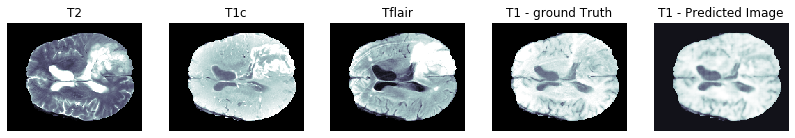

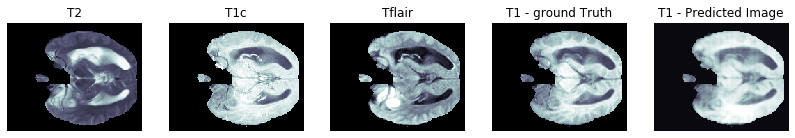

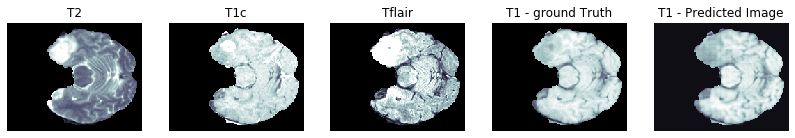

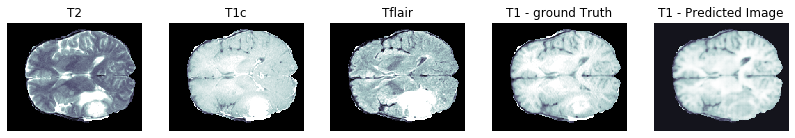

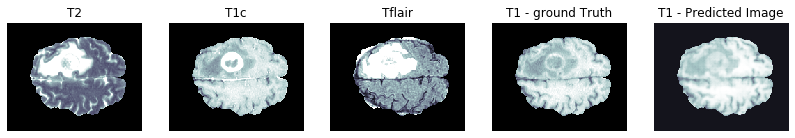

PSNR on validation set: 25.4276 ± 3.2986
MSE on validation set: 0.0035 ± 0.0020
SSIM on validation set: 0.8590 ± 0.0721

PSNR wrt tumor area on validation set: 36.8852 ± 9.2273
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9806 ± 0.0181

Generator loss on validation set: 0.1082 ± 0.0034
Discriminator loss on validation set: 0.0103 ± 0.0062

Epoch:  23
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.........................................................................

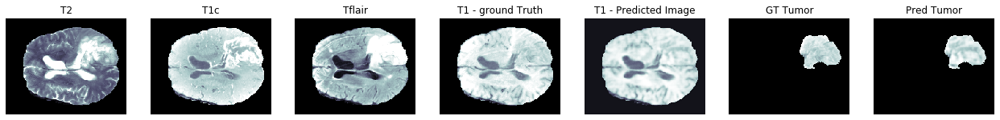

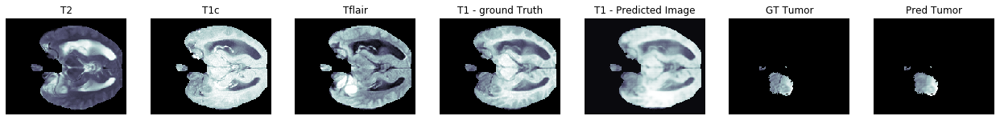

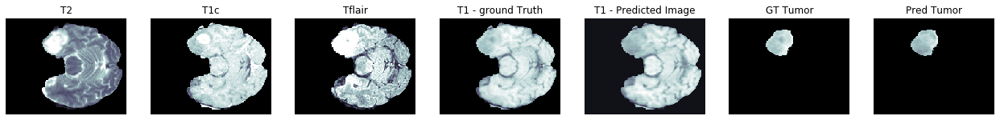

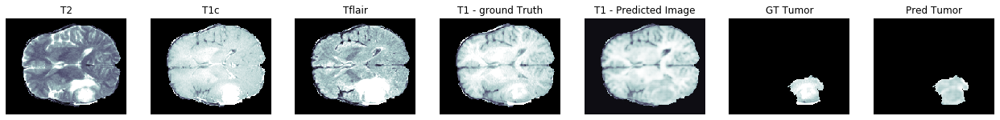

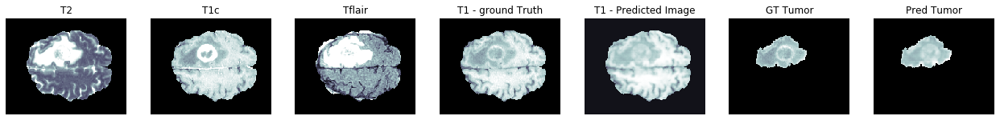

PSNR on validation set: 25.3421 ± 3.3845
MSE on validation set: 0.0037 ± 0.0027
SSIM on validation set: 0.8605 ± 0.0738

PSNR wrt tumor area on validation set: 37.0044 ± 9.9500
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9807 ± 0.0182

Generator loss on validation set: 0.1101 ± 0.0039
Discriminator loss on validation set: 0.0102 ± 0.0060

Time taken for epoch 23 is 906.5625972747803 sec


Epoch:  24
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

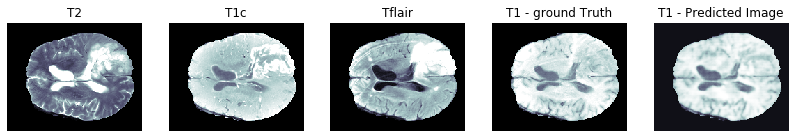

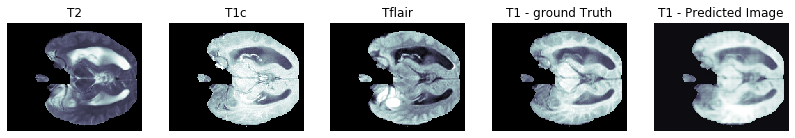

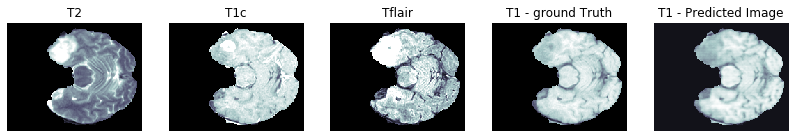

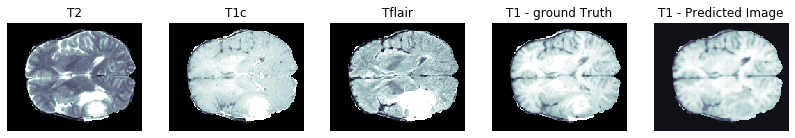

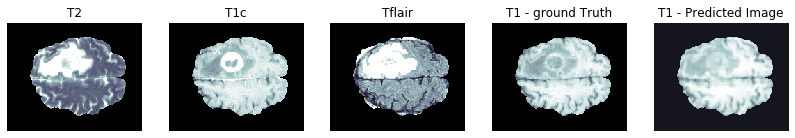

PSNR on validation set: 25.3123 ± 3.3099
MSE on validation set: 0.0036 ± 0.0022
SSIM on validation set: 0.8582 ± 0.0727

PSNR wrt tumor area on validation set: 36.9701 ± 10.2523
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9803 ± 0.0183

Generator loss on validation set: 0.0968 ± 0.0043
Discriminator loss on validation set: 0.0342 ± 0.0109

Time taken for epoch 24 is 896.1105906963348 sec


Epoch:  25
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

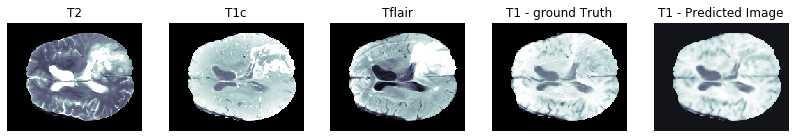

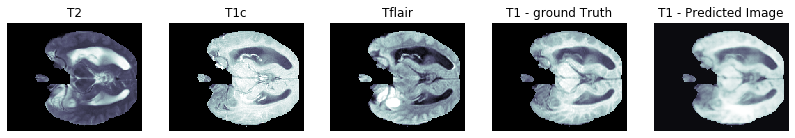

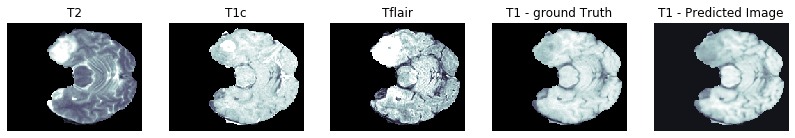

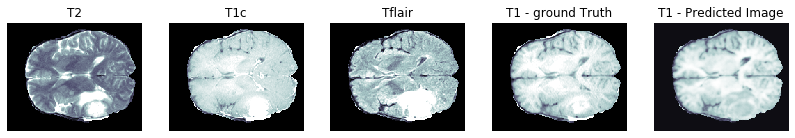

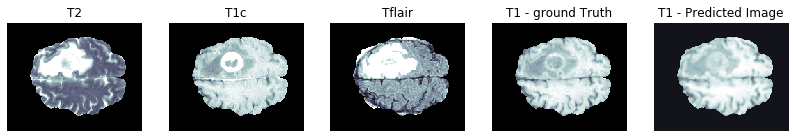

PSNR on validation set: 25.3065 ± 3.4101
MSE on validation set: 0.0037 ± 0.0026
SSIM on validation set: 0.8616 ± 0.0733

PSNR wrt tumor area on validation set: 36.8885 ± 9.2312
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9809 ± 0.0180

Generator loss on validation set: 0.1085 ± 0.0033
Discriminator loss on validation set: 0.0092 ± 0.0056

Time taken for epoch 25 is 895.1507976055145 sec


Epoch:  26
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

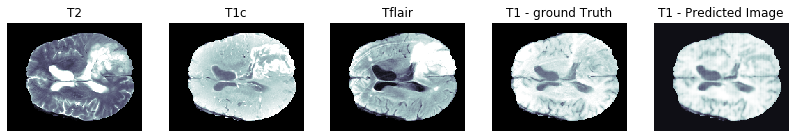

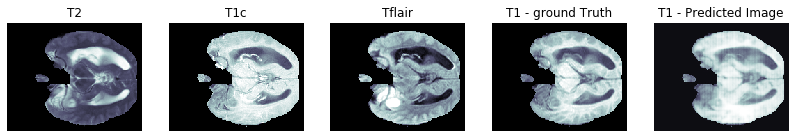

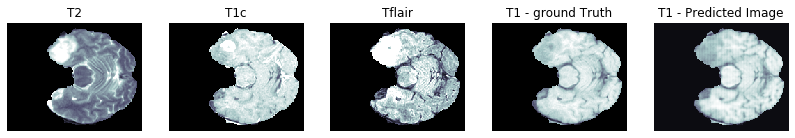

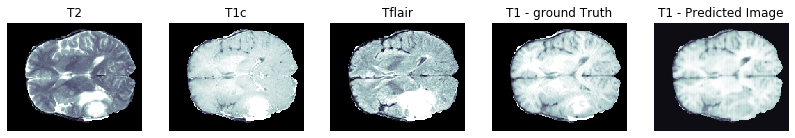

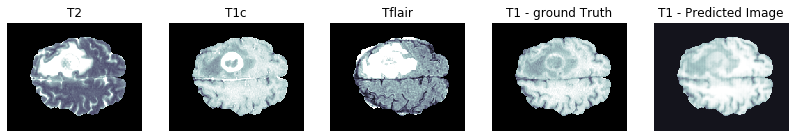

PSNR on validation set: 25.4973 ± 3.2795
MSE on validation set: 0.0035 ± 0.0020
SSIM on validation set: 0.8549 ± 0.0736

PSNR wrt tumor area on validation set: 36.8952 ± 9.9328
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9796 ± 0.0186

Generator loss on validation set: 0.1066 ± 0.0036
Discriminator loss on validation set: 0.0152 ± 0.0080

Time taken for epoch 26 is 895.3486847877502 sec


Epoch:  27
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

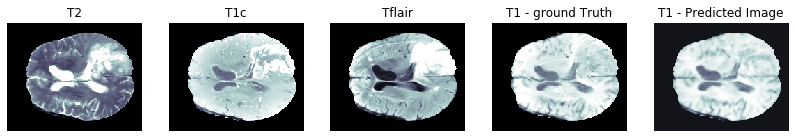

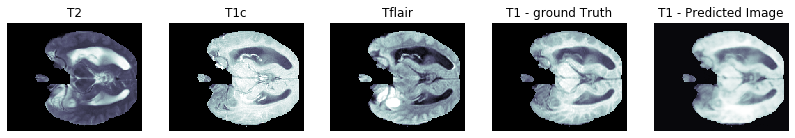

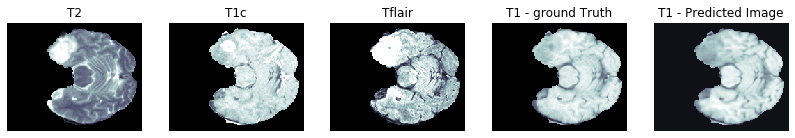

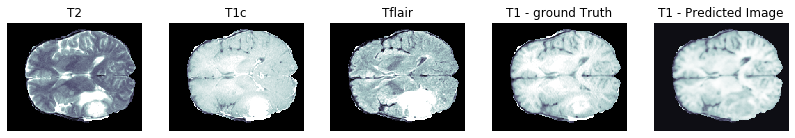

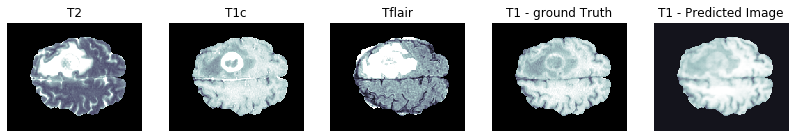

PSNR on validation set: 25.4719 ± 3.3611
MSE on validation set: 0.0035 ± 0.0020
SSIM on validation set: 0.8616 ± 0.0718

PSNR wrt tumor area on validation set: 36.9487 ± 9.2963
MSE wrt tumor area on validation set: 0.0005 ± 0.0005
SSIM wrt tumor area on validation set: 0.9807 ± 0.0181

Generator loss on validation set: 0.1090 ± 0.0034
Discriminator loss on validation set: 0.0089 ± 0.0056

Saving checkpoint for epoch 27 at ./drive/My Drive/checkpoints/gen_t1_v4/ckpt-6
Time taken for epoch 27 is 903.0390920639038 sec


Epoch:  28
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
...............................................

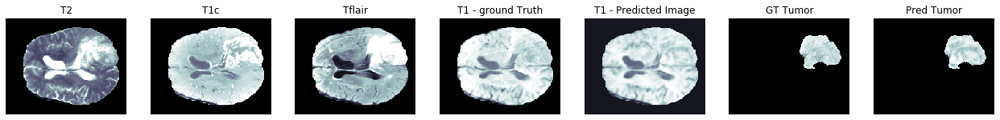

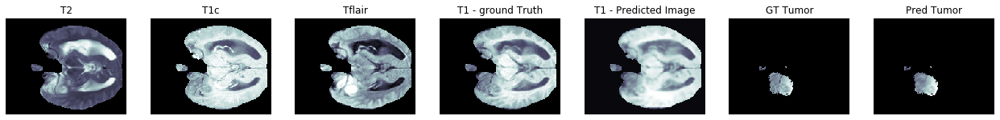

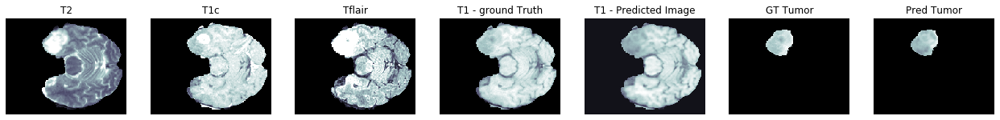

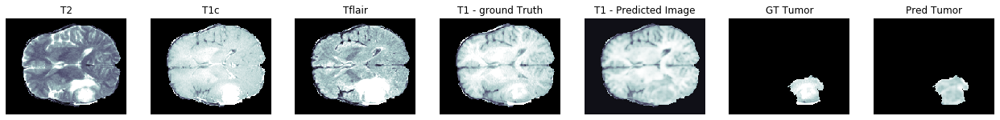

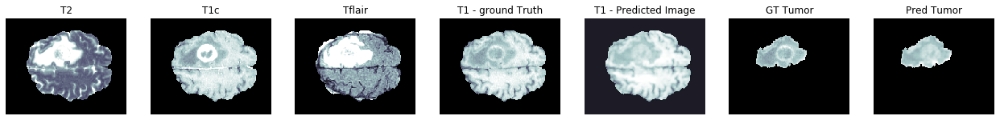

PSNR on validation set: 25.1292 ± 3.3906
MSE on validation set: 0.0038 ± 0.0022
SSIM on validation set: 0.8609 ± 0.0724

PSNR wrt tumor area on validation set: 37.0750 ± 11.2163
MSE wrt tumor area on validation set: 0.0005 ± 0.0005
SSIM wrt tumor area on validation set: 0.9807 ± 0.0182

Generator loss on validation set: 0.1059 ± 0.0028
Discriminator loss on validation set: 0.0100 ± 0.0060

Time taken for epoch 28 is 895.2753348350525 sec


Epoch:  29
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

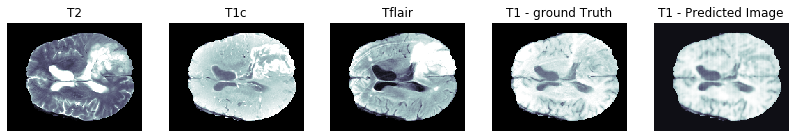

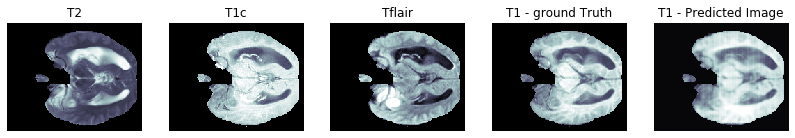

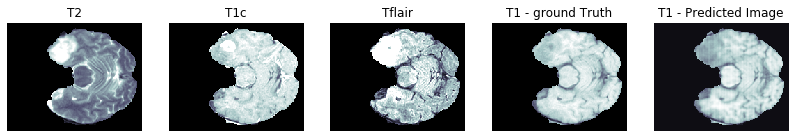

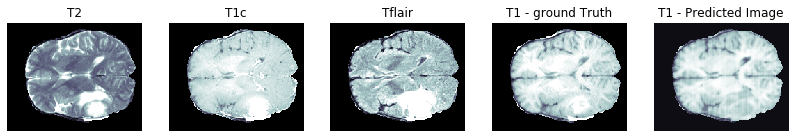

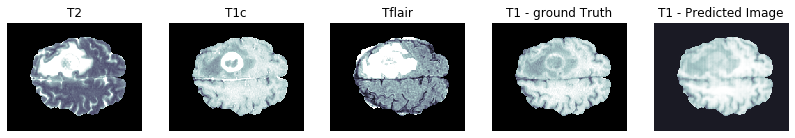

PSNR on validation set: 25.2110 ± 3.3801
MSE on validation set: 0.0038 ± 0.0023
SSIM on validation set: 0.8541 ± 0.0750

PSNR wrt tumor area on validation set: 36.9860 ± 10.4991
MSE wrt tumor area on validation set: 0.0005 ± 0.0005
SSIM wrt tumor area on validation set: 0.9797 ± 0.0188

Generator loss on validation set: 0.1101 ± 0.0037
Discriminator loss on validation set: 0.0088 ± 0.0054

Time taken for epoch 29 is 894.8707160949707 sec


Epoch:  30
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

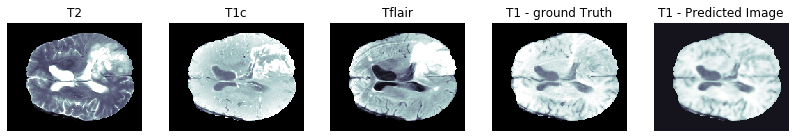

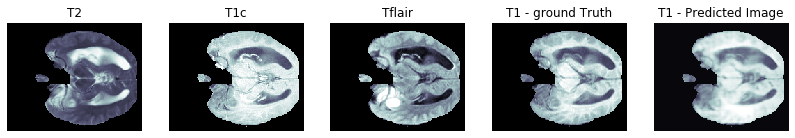

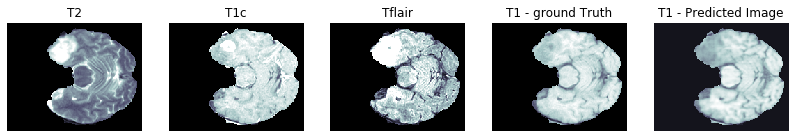

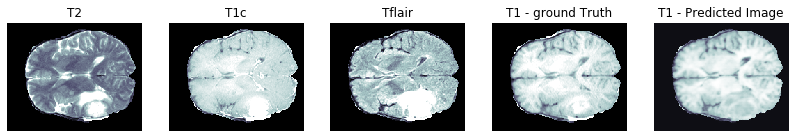

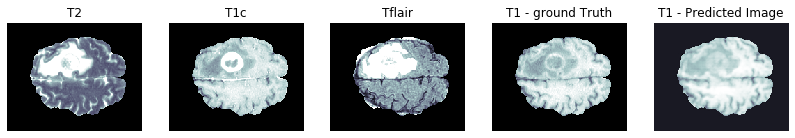

PSNR on validation set: 25.3115 ± 3.3898
MSE on validation set: 0.0037 ± 0.0028
SSIM on validation set: 0.8604 ± 0.0743

PSNR wrt tumor area on validation set: 36.9668 ± 9.9939
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9806 ± 0.0183

Generator loss on validation set: 0.1103 ± 0.0040
Discriminator loss on validation set: 0.0074 ± 0.0049

Time taken for epoch 30 is 895.7435021400452 sec


Epoch:  31
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

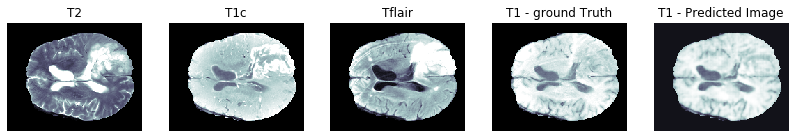

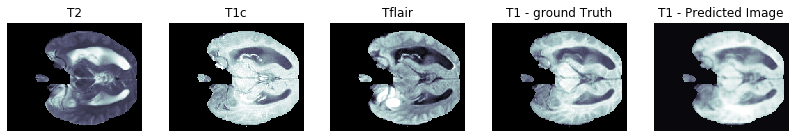

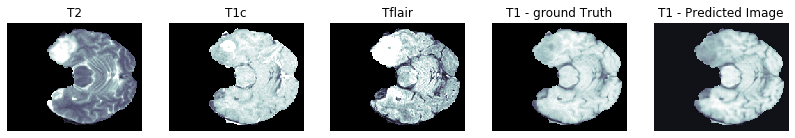

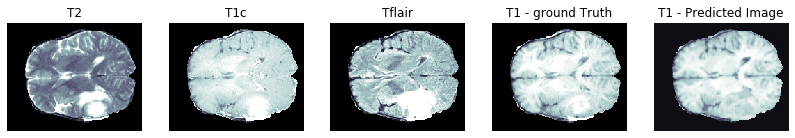

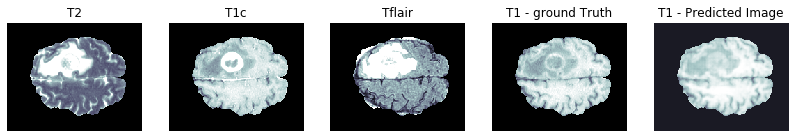

PSNR on validation set: 25.2807 ± 3.3945
MSE on validation set: 0.0037 ± 0.0031
SSIM on validation set: 0.8582 ± 0.0759

PSNR wrt tumor area on validation set: 37.0475 ± 11.2719
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9801 ± 0.0186

Generator loss on validation set: 0.1099 ± 0.0041
Discriminator loss on validation set: 0.0075 ± 0.0053

Time taken for epoch 31 is 894.5520973205566 sec


Epoch:  32
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

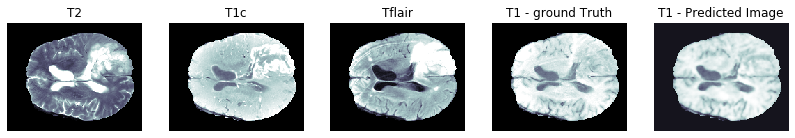

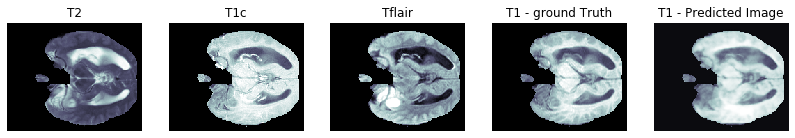

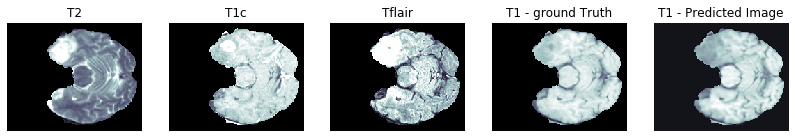

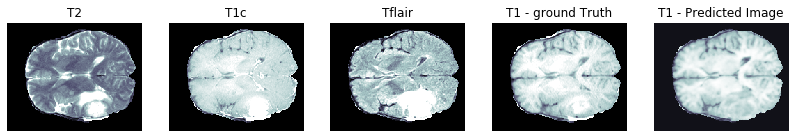

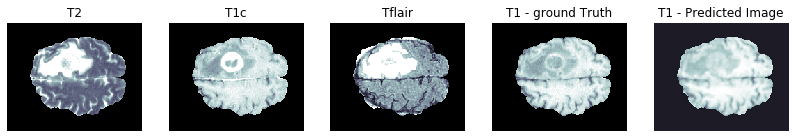

PSNR on validation set: 25.0880 ± 3.4262
MSE on validation set: 0.0039 ± 0.0032
SSIM on validation set: 0.8580 ± 0.0762

PSNR wrt tumor area on validation set: 36.9053 ± 9.8940
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9802 ± 0.0186

Generator loss on validation set: 0.1099 ± 0.0037
Discriminator loss on validation set: 0.0073 ± 0.0050

Saving checkpoint for epoch 32 at ./drive/My Drive/checkpoints/gen_t1_v4/ckpt-7
Time taken for epoch 32 is 902.227283000946 sec


Epoch:  33
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
................................................

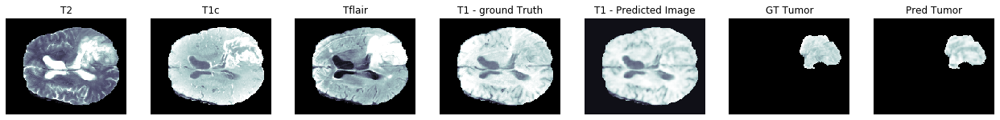

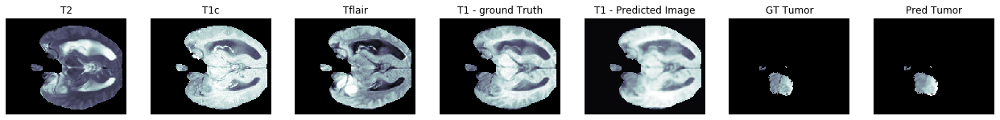

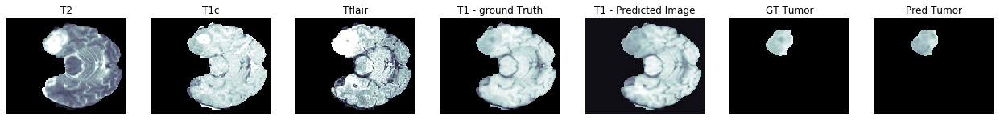

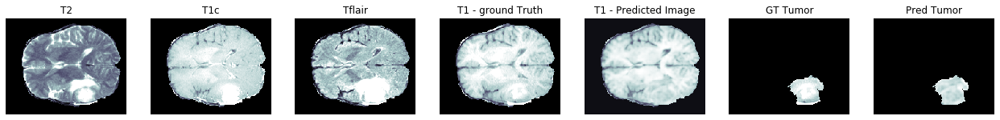

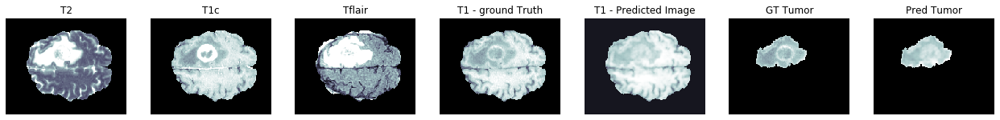

PSNR on validation set: 25.6142 ± 3.3826
MSE on validation set: 0.0034 ± 0.0021
SSIM on validation set: 0.8596 ± 0.0732

PSNR wrt tumor area on validation set: 37.0700 ± 11.5698
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9799 ± 0.0186

Generator loss on validation set: 0.1093 ± 0.0037
Discriminator loss on validation set: 0.0073 ± 0.0049

Time taken for epoch 33 is 896.0178191661835 sec


Epoch:  34
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

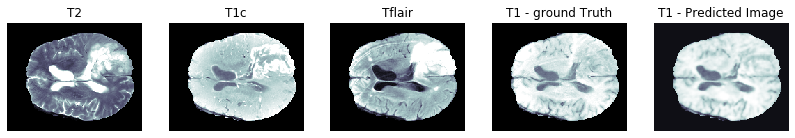

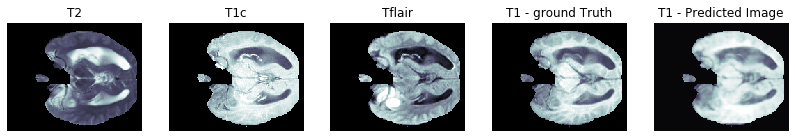

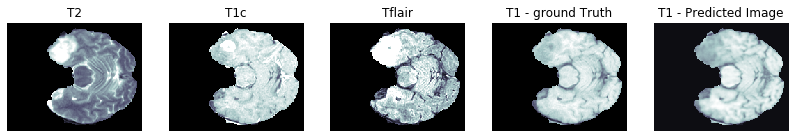

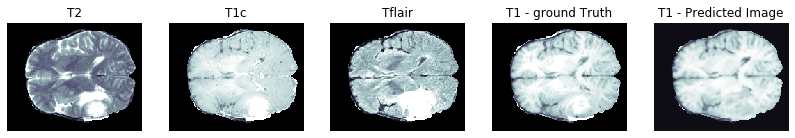

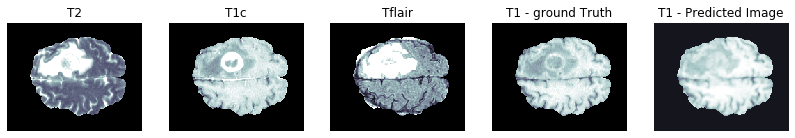

PSNR on validation set: 25.6057 ± 3.4255
MSE on validation set: 0.0035 ± 0.0032
SSIM on validation set: 0.8580 ± 0.0767

PSNR wrt tumor area on validation set: 36.9512 ± 11.5639
MSE wrt tumor area on validation set: 0.0006 ± 0.0006
SSIM wrt tumor area on validation set: 0.9796 ± 0.0190

Generator loss on validation set: 0.1058 ± 0.0042
Discriminator loss on validation set: 0.0427 ± 0.0201

Time taken for epoch 34 is 895.3389530181885 sec


Epoch:  35
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

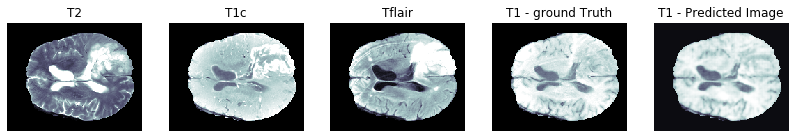

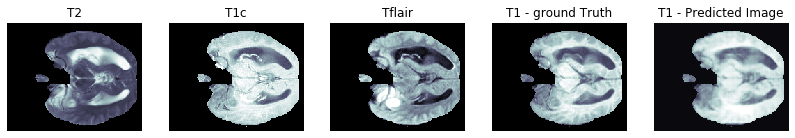

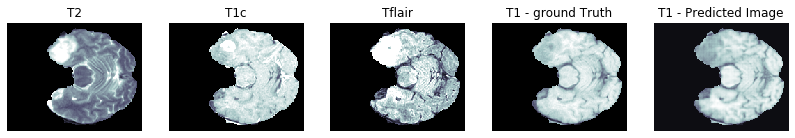

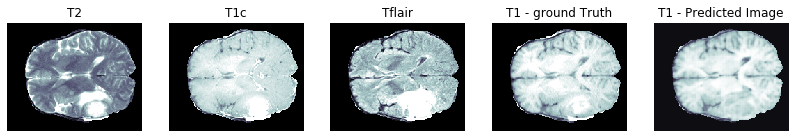

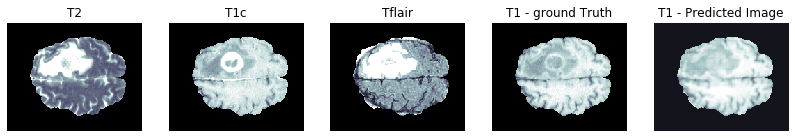

PSNR on validation set: 25.5148 ± 3.3686
MSE on validation set: 0.0035 ± 0.0020
SSIM on validation set: 0.8571 ± 0.0736

PSNR wrt tumor area on validation set: 36.9755 ± 10.8477
MSE wrt tumor area on validation set: 0.0005 ± 0.0005
SSIM wrt tumor area on validation set: 0.9798 ± 0.0187

Generator loss on validation set: 0.1090 ± 0.0032
Discriminator loss on validation set: 0.0092 ± 0.0062

Time taken for epoch 35 is 895.042685508728 sec


Epoch:  36
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

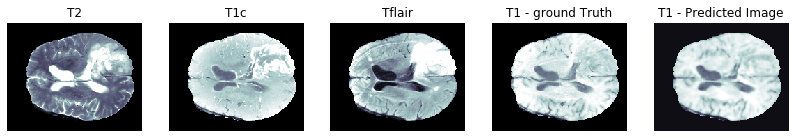

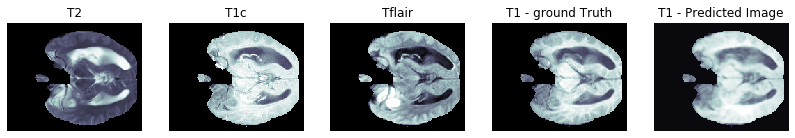

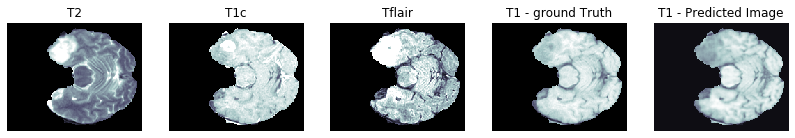

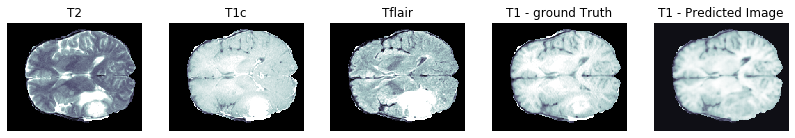

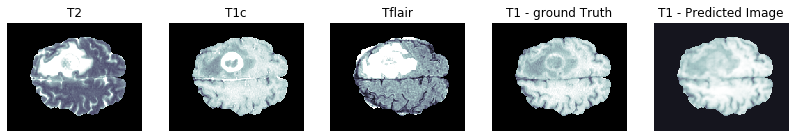

PSNR on validation set: 25.3466 ± 3.3971
MSE on validation set: 0.0036 ± 0.0021
SSIM on validation set: 0.8586 ± 0.0730

PSNR wrt tumor area on validation set: 36.8534 ± 9.8942
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9800 ± 0.0187

Generator loss on validation set: 0.1094 ± 0.0037
Discriminator loss on validation set: 0.0136 ± 0.0081

Time taken for epoch 36 is 895.7583737373352 sec


Epoch:  37
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

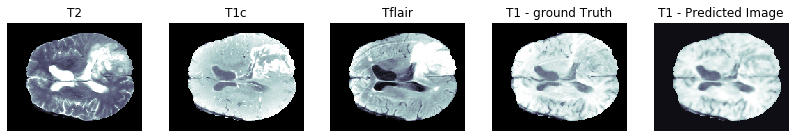

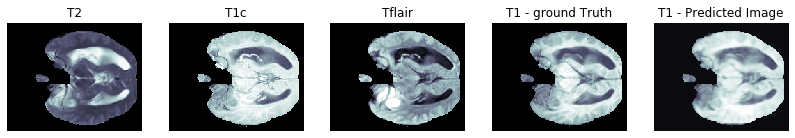

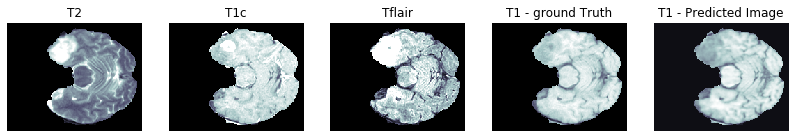

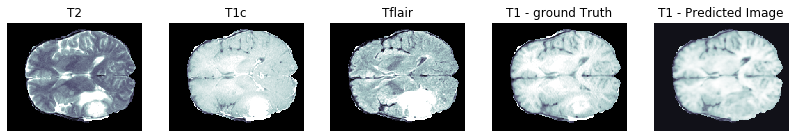

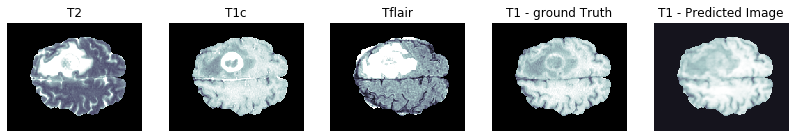

PSNR on validation set: 25.4497 ± 3.4303
MSE on validation set: 0.0036 ± 0.0027
SSIM on validation set: 0.8586 ± 0.0755

PSNR wrt tumor area on validation set: 36.7733 ± 9.2223
MSE wrt tumor area on validation set: 0.0005 ± 0.0005
SSIM wrt tumor area on validation set: 0.9799 ± 0.0187

Generator loss on validation set: 0.1095 ± 0.0035
Discriminator loss on validation set: 0.0121 ± 0.0079

Saving checkpoint for epoch 37 at ./drive/My Drive/checkpoints/gen_t1_v4/ckpt-8
Time taken for epoch 37 is 906.5608816146851 sec


Epoch:  38
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
...............................................

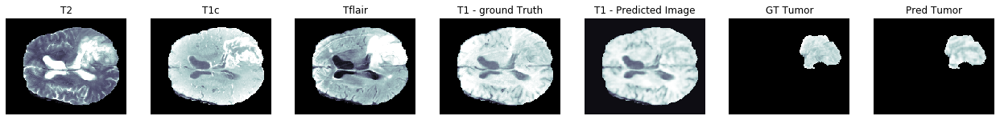

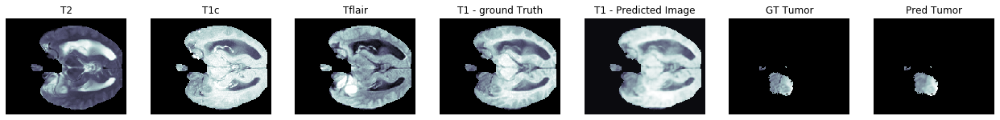

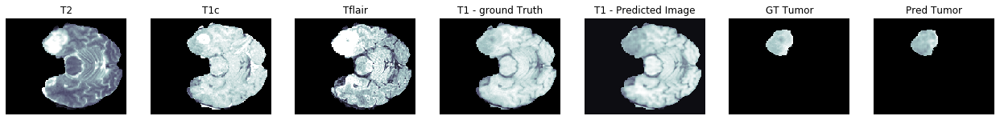

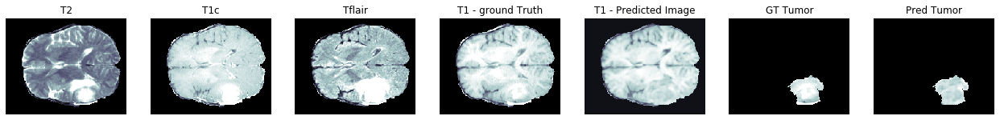

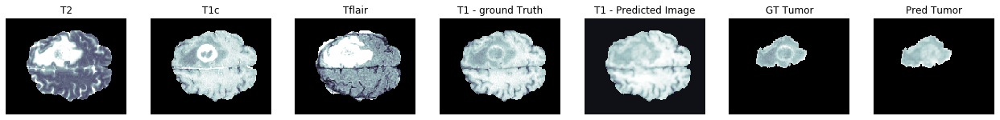

PSNR on validation set: 25.5455 ± 3.4565
MSE on validation set: 0.0035 ± 0.0026
SSIM on validation set: 0.8592 ± 0.0750

PSNR wrt tumor area on validation set: 36.7750 ± 9.2490
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9799 ± 0.0188

Generator loss on validation set: 0.1077 ± 0.0036
Discriminator loss on validation set: 0.0085 ± 0.0054

Time taken for epoch 38 is 896.6160843372345 sec


Epoch:  39
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

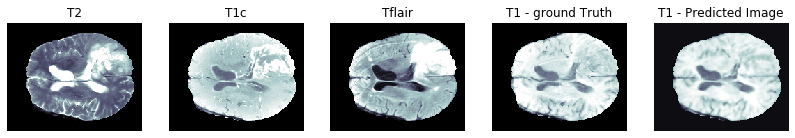

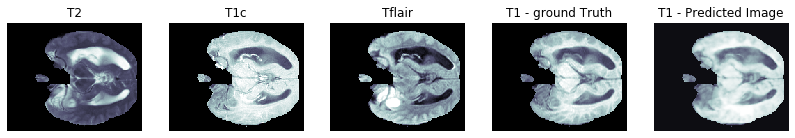

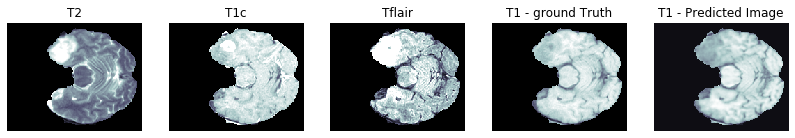

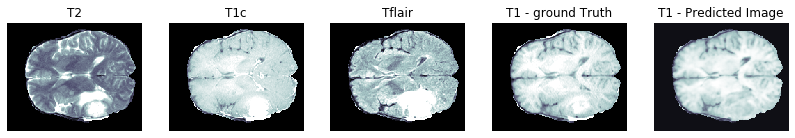

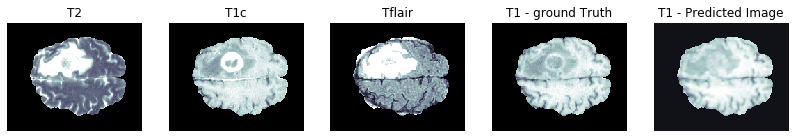

PSNR on validation set: 25.4316 ± 3.4205
MSE on validation set: 0.0036 ± 0.0026
SSIM on validation set: 0.8572 ± 0.0756

PSNR wrt tumor area on validation set: 36.7321 ± 9.2289
MSE wrt tumor area on validation set: 0.0005 ± 0.0006
SSIM wrt tumor area on validation set: 0.9797 ± 0.0188

Generator loss on validation set: 0.1096 ± 0.0035
Discriminator loss on validation set: 0.0286 ± 0.0183

Time taken for epoch 39 is 895.9677600860596 sec

Saving FINAL checkpoint for epoch 39 at ./drive/My Drive/checkpoints/gen_t1_v4/ckpt-9


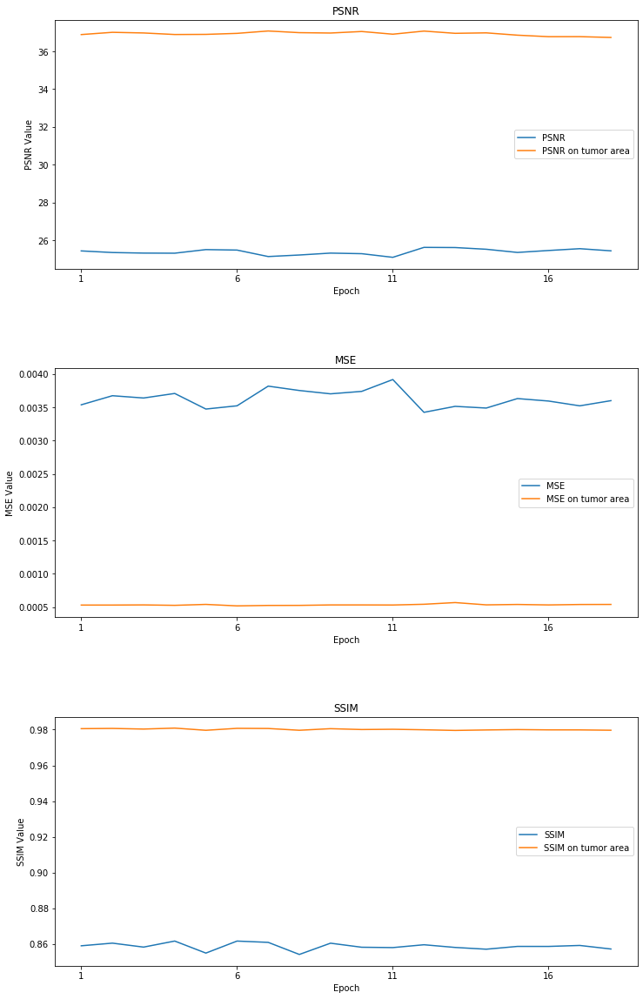

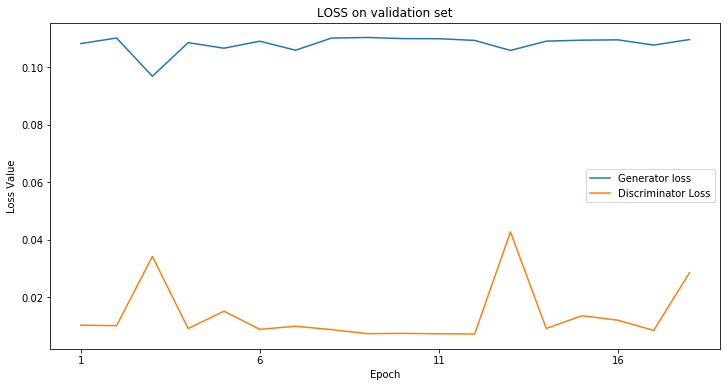

In [47]:
EPOCHS = 17
save_checkpoint = True         # want to save new checkpoints ? 
save_final_models = False       # want to save the model at the end of the training ? 
epochs_already_trained = 22      # this is just for the print. 
evaluate_tumor_quality = True   # compute & print metrics on tumor area ?
print_loss = True               # compute & print the validation loss ?


# Initialize the models, so that I don't have to restart the runtime again.

if tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, False):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = fit(training, EPOCHS, validation, save_checkpoint, 
                 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)

elif tf.equal(evaluate_tumor_quality, False) and tf.equal(print_loss, True):
    psnr, mse, ssim, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)
    plot_loss(gen_loss, dis_loss)

elif tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, True):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                        epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)
    plot_loss(gen_loss, dis_loss)
else:
    psnr, mse, ssim = fit(training, EPOCHS, validation, save_checkpoint, 
                                                      epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)

# at the end, I'll save the models (I would need only the gen, but let's sayve also the disc  )
# (it saves the entire model to a HDF5 file)

if save_final_models:
    generator.save('drive/My Drive/MRI-generation/gen_t2_70ep_MI-GAN_v4.h5')

##Evaluating the final model with the test set

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, testing, 'test', True, True)

## Considerations about metrics and normalization

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

In [0]:
for raw_record in testing.take(1):
    inp, ground_truth = take_images_from_raw(raw_record)

    prediction = generator(inp, training=False)
    inp, ground_truth, prediction = resize_with_crop(inp, ground_truth, prediction)

    prediction_normalized = mean_normalize(prediction)
    ground_truth_normalized = mean_normalize(ground_truth) 

    #prediction_normalized2 = min_max_normalize(prediction)
    
    # remove black images from ground_truth is not that necessary because it's enough to do it on the predictions. 
    # Anyway, just to be sure, let's remove them also from the ground truth (so the metrics of those images will be ignored)

    # BLACK IMAGES ARE DISCARDED IN ALL THE METRICS COMPUTED. Both in the case where I normalize and in the one in which I don't.
    # What if, in the case in which I don't normalize, I keep the black images? We would have significant differences.
    # For example PSNR would be 27.0207 ± 10.2544 instead of  25.2498 ± 2.8603 (with the model trained)
    ground_truth = black_images_to_nan(ground_truth)
    prediction = black_images_to_nan(prediction)

    #mean, std, psnr = compute_psnr(ground_truth, prediction_normalized2)
    #print("PSNR w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth_normalized, prediction_normalized)
    print("PSNR w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth, prediction)
    print("PSNR: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, ssim = compute_ssim(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth_normalized, prediction_normalized)
    print("SSIM w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth, prediction)
    print("SSIM: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, mse = compute_mse(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth_normalized, prediction_normalized)
    print("MSE w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth, prediction)
    print("MSE: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))

## Additional notes

Implementation of MI-GAN with instance normalization and with the discriminator loss multiplied by 0.5 doesn't reach good results: CONVERGENCE FAILURE. 
The discriminator loss was stable and very close to zero. Why this? Generator is not producing good enough images so the work for the Discirminator is pretty easy. There is something about fake images that makes them very easy for the D to identify. 

In [0]:
# in the testing there are 28 patients so 128*28 = 3584 samples
# with a batch_size of 32, we have 112 elements in the prefetched TEST set so 3584 samples.
# in the VALIDATION SET: 108 elements * 32 (batch_size) = 3456 samples.
# in the TRAINING set: 876 elements * 32 = 28032

# each samples has then all the scans defined in the load_dataset (up to 4 scans + the segmented area)
# if batch size is set to 32, then there are less then 100 samples.

# training: with GPU it crashes, with TPU works. a bit more of 28000 samples -> 219 patients * 128 levels.

# training with 100 samples, batch size = 1 and TPU took 46 seconds
# training with 100 samples, batch size = 1 and GPU took 7/8 seconds

# training with 1000 samples, batch size = 1, resizing to 256, GPU took 54 seconds
# training with 1000 samples, batch size = 1, padding to 256, GPU took 52 seconds

# TRAINING TIMES WITH DIFFERENT BATCH SIZES:
# training with 16 samples and batch size = 64 (so 1024 samples fed to the GAN), TPU took 209 seconds

# training with 1000 samples and batch size = 1 (so 1000 samples fed to the GAN), GPU took about 490 seconds (8 min)
# training with 250 samples and bs = 4 (so 1000 samples fed to the GAN), GPU took 127 seconds!
# training with 128 samples and bs = 8 (so 1024 samples fed to the GAN), GPU took 75 seconds!
# training with 64 samples and bs = 16 (so 1024 samples fed to the GAN), GPU took 41 seconds!
# training with 31 samples and bs = 32 (so still 992 samples fed to the GAN), GPU took 28/32/33
# training with 16 samples and bs = 64 (so 1024 samples fed to the GAN), GPU took 23/25/26 seconds!

# training with 8 samples and bs = 128, GPU took 24/25( 21 in the most recent) sec! -> not so good quality
# (It has been observed in practice that when using a larger batch there is a significant degradation in the 
# quality of the model, as measured by its ability to generalize.)
# https://stats.stackexchange.com/questions/164876/tradeoff-batch-size-vs-number-of-iterations-to-train-a-neural-network

# The resulting model may not generalize as well as a model trained with a small batch size

# tradeoff between 32 and 64. 32 seems to be qualitatively more accurate but it's a bit slower. 
# before choosing, it would be better to implement also the quantitative metrics.

# from pix2pix paper: use batch sizes between 1 and 10 depending on the experiment


# In general, batch size of 32 is a good starting point, and you should also try with 64, 128, and 256. 
# Other values (lower or higher) may be fine for some data sets, but the given range is generally the best to 
# start experimenting with. Though, under 32, it might get too slow because of significantly lower computational speed, 
# because of not exploiting vectorization to the full extent.  
# If you get an "out of memory" error, you should try reducing the mini-batch size anyway.


# training with 4 samples and bs = 256, GPU run out of memory. Resource exhausted.

In [0]:
# np.FUNCTION VS tf.FUNCTION

# np =  training with 31 samples and bs = 32 (992 samples fed to the GAN), GPU took 28/32/33
# training with 32 samples and bs = 32 (1024 samples fed to the GAN), GPU took 14/15/16/17 seconds 